<a href="https://colab.research.google.com/github/kteppris/RealWaste/blob/main/EDA_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**22.02.2024 (Flemming)**: \
Hier möchte ich die EDA mal ein wenig "ins Reine schreiben". \
Die Kommentare im Code ändere ich später nochmal, ich will erstmal die Inhalte haben und dass es funktioniert.

# Explorative Datenanalyse (EDA)

Der Begriff der Explorativen Datenanalyse (EDA) geht auf [Tukey (1962)](https://www.jstor.org/stable/i312810) zurück, der den Begriff der Datenanalyse wie folgt definierte:
\
\
_"Procedures for analyzing data, techniques for interpreting the results of such procedures, ways of planning the gathering of data to make its analysis easier, more precise or more accurate, and all the machinery and results of (mathematical) statistics which apply to analyzing data."_
\
\
Die EDA ziehlt demnach darauf ab, mit statistischen Methoden die wesentlichen Strukturen eines Datensatzes zu entdecken, Muster und Anomalien zu identifizieren und die weiteren Analysen durch die gewonnenen Einblicke zu leiten.

Das [DASC-PM v1.1](https://info.nordakademie.de/hubfs/Website%20Relaunch%202022/Forschungsthemen/DASC-PM_v1.1.pdf) verortet die EDA in der Projektphase der _Datenbereitstellung_.
Als Ergebnis dieser Projektphase ensteht aus einer oder mehreren _Ursprungsdatenquellen_ eine _Analytische Datenquelle_, die im weiteren Projektverlauf zu Analysezwecken genutzt wird.

Um diese Analytische Datenquelle zu erzeugen, ist die Bearbeitung der Kernaufgaben _Datenaufbereitung_, _Datenmanagement_ und _Explorative Datenanalyse_ erforderlich.

Das DASC-PM v1.1 schreibt für die EDA keine feste Abfolge für anzuwenende Verfahren vor, da auch ihre Auswahl vom Untersuchungsgegenstand abhängig ist.

Beim Untersuchungsgegenstand dieser Ausarbeitung, dem [RealWaste-Datensatz](https://ieee-dataport.org/documents/realwaste#:~:text=RealWaste%20is%20an%20image%20dataset,facility%20in%20Wollongong%20NSW%20Australia.) handelt es sich wie in **Verweis** beschrieben um Bilddateien und somit um unstrukturierte, hochdimensionale Daten, die aus einer Vielzahl von Pixelwerten bestehen.

Die nachfolgende EDA zielt darauf ab, für den untersuchten Datensatz die Verteilung über die Klassen zu ermitteln und eine zufällige Auswahl von Bildern aus dem Datensatz einer ersten visuellen Inspektion zu unterziehen. \
Aus dieser Erstinspektion werden weitere Schritte im Rahmen der EDA zu weiterführenden Untersuchungen durch _Farbhistogramme_, _Local Binary Patterns (LBP)_ oder _Canny Edge Detection Filter_ abgeleitet. Diese weiterführenen Untersuchungen zielen darauf ab, Features aus den Bildern des RealWaste-Datensatzes zu extrahieren. \

Ziel der EDA ist es, die gewonnen Features mit klassischen ML-Methoden wie K-Nearest-Neigbors (KNN), Support Vector Machines (SVM) oder Random Forest für eine Klassifikation der Bilder einzusetzen.

Die zentralen Erkenntnisse der EDA werden in Form von Artefakten (Visualisierungen oder Modelle) festgehalten und Probleme bei der Datenqualität sowie Änderungen des Datenmaterials dokumentiert.

Für spätere Deep-Learning-Ansätze im Rahmen dieser Ausarbeitung stellen die vorangestellt im Rahmen der EDA verprobten klassischen Ansätze eine Benchmark dar.

***
**Quellen:**
* DASC-PM v1.1 \
https://info.nordakademie.de/hubfs/Website%20Relaunch%202022/Forschungsthemen/DASC-PM_v1.1.pdf
* Tukey, J. W. (1962). The Future of Data Analysis. The Annals of Mathematical Statistics, 33(1), 1–67.
http://www.jstor.org/stable/2237638
* RealWaste-Datensatz \
https://ieee-dataport.org/documents/realwaste#:~:text=RealWaste%20is%20an%20image%20dataset,facility%20in%20Wollongong%20NSW%20Australia.

***

## Daten laden und vorverarbeiten

### Daten laden

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os

# Ändern Sie diesen Pfad zu dem Ort, an dem sich Ihr RealWaste-Ordner befindet
# data_path = 'drive/mydrive/RealWaste'
%cd drive/MyDrive/RealWaste


# Überprüfen Sie den aktuellen Arbeitsordner
print("Current Directory:", os.getcwd())

# Listen Sie die Inhalte des Datenverzeichnisses auf und gibt die Namen der Klassen-Unterordner aus
print("Directory Contents:", os.listdir('.'))

/content/drive/MyDrive/RealWaste
Current Directory: /content/drive/MyDrive/RealWaste
Directory Contents: ['Cardboard', 'Food Organics', 'Glass', 'Metal', 'Miscellaneous Trash', 'Paper', 'Plastic', 'Textile Trash', 'Vegetation']


### Daten vorverarbeiten

Das Dictionary '**images_resized**' wird im Ergebnis der Vorverarbeitung erzeugt.

Alternativ hier für die Vorverarbeitung später den Code von Keno verwenden.

In [3]:
import os
from PIL import Image
import numpy as np

def load_and_resize_images(data_path, new_size=(64, 64)): # Bilder neu skaliert mit dem Argument 'new_size(,)'
    images_resized = {}
    class_names = os.listdir(data_path)  # Jedes Unterverzeichnis entspricht einer Klasse des RealWaste-Datensatzes

    for class_name in class_names:
        class_folder = os.path.join(data_path, class_name)
        image_files = os.listdir(class_folder)
        images_resized[class_name] = []

        for image_file in image_files:
            img_path = os.path.join(class_folder, image_file)
            img = Image.open(img_path)
            img_resized = img.resize(new_size)
            images_resized[class_name].append(np.array(img_resized))

    return images_resized

# Neue Größe auf die Bilder aus meinem Ordner anwenden
images_resized = load_and_resize_images(data_path='/content/drive/MyDrive/RealWaste')

## Anzahl Bilder und Verteilung auf die Klassen

In [ ]:
data_path = '.' # beziehe dich auf den aktuellen Ordnerpfad mit '.'.
# Der korrekte Ordnerpfad wurde bereits weiter oben ausgewählt.

# Alle Klassenordner auflisten
classes = os.listdir(data_path)

# Statistiken initialisieren
images_per_class = {}

for class_name in classes:
    # Pfad zum Klassenordner
    class_path = os.path.join(data_path, class_name)

    # Alle Dateien in diesem Klassenordner auflisten
    images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Anzahl der Bilder in diesem Klassenordner zählen
    image_count = len(images)
    images_per_class[class_name] = image_count

# Ergebnisse ausgeben
for class_name, count in images_per_class.items():
    print(f"Class '{class_name}' has {count} images")

Class 'Cardboard' has 461 images
Class 'Food Organics' has 411 images
Class 'Glass' has 420 images
Class 'Metal' has 790 images
Class 'Miscellaneous Trash' has 495 images
Class 'Paper' has 500 images
Class 'Plastic' has 921 images
Class 'Textile Trash' has 318 images
Class 'Vegetation' has 436 images


<ipython-input-5-b9ddb24c129a>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=image_counts, y=class_names, palette="viridis")


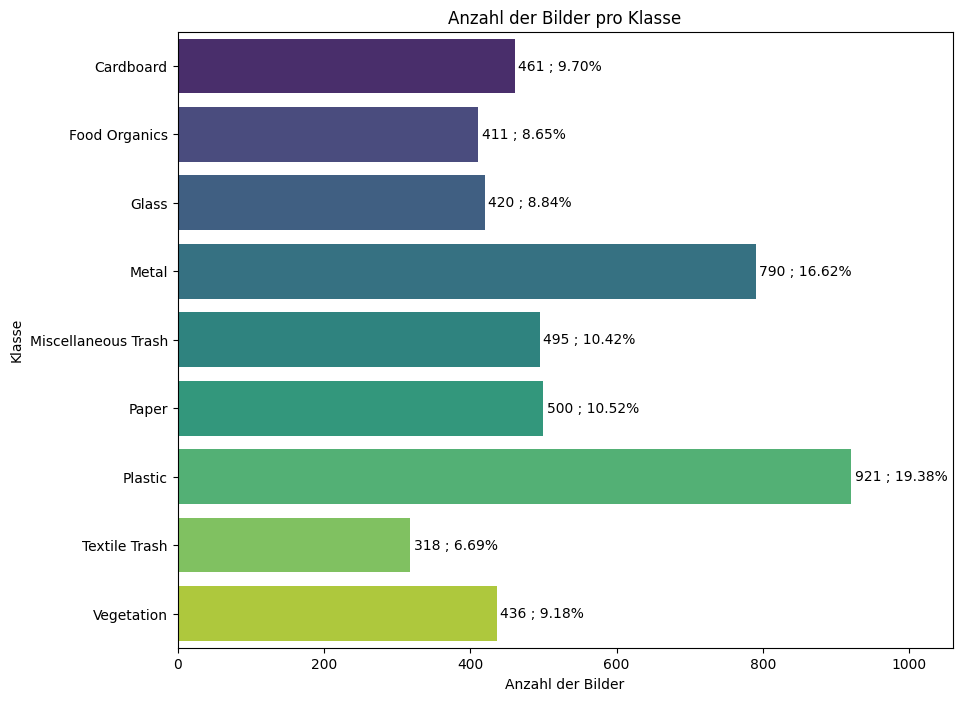

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Daten für das Balkendiagramm vorbereiten
class_names = list(images_per_class.keys())
image_counts = list(images_per_class.values())

# Gesamtanzahl der Bilder berechnen
total_images = sum(image_counts)

# Balkendiagramm erstellen
plt.figure(figsize=(10, 8))
sns.barplot(x=image_counts, y=class_names, palette="viridis")
plt.title('Anzahl der Bilder pro Klasse')
plt.xlabel('Anzahl der Bilder')
plt.ylabel('Klasse')

# Rechten Rand für Textbeschriftungen erhöhen
plt.xlim(0, max(image_counts) * 1.15)  # 15% mehr Platz für Beschriftungen

# Beschriftungen mit Prozentangabe hinzufügen
for index, value in enumerate(image_counts):
    percentage = (value / total_images) * 100  # Prozentualen Anteil berechnen
    plt.text(value + max(image_counts) * 0.005, index, f"{value} ; {percentage:.2f}%", va='center')  # Etwas Puffer hinzufügen

plt.show()

## Beispielbilder anzeigen

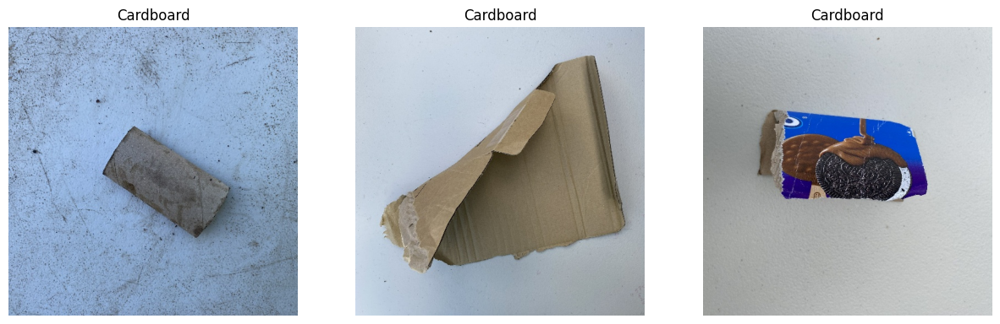

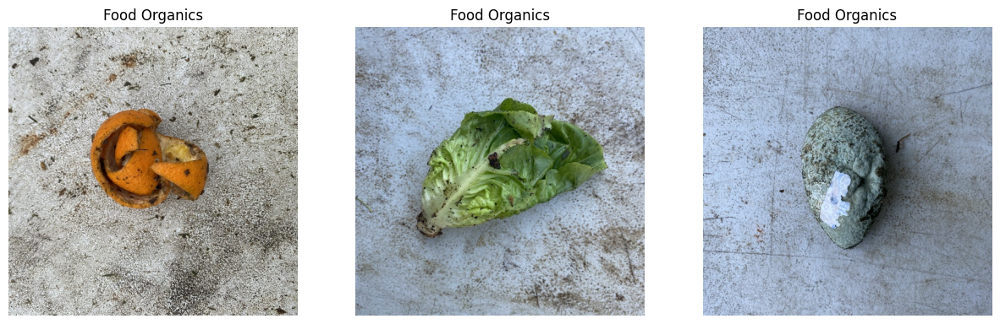

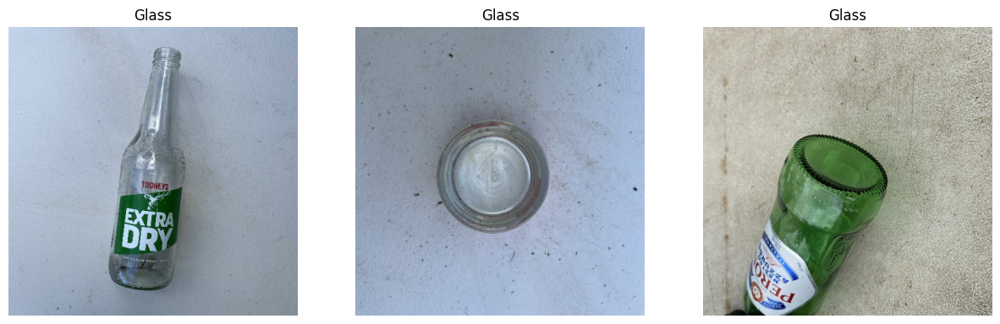

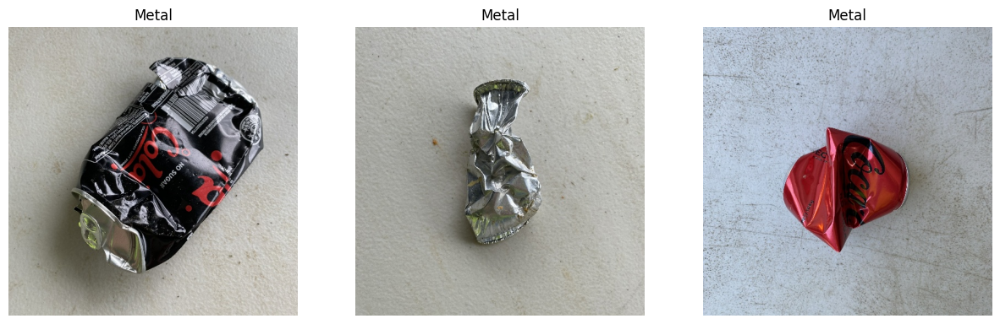

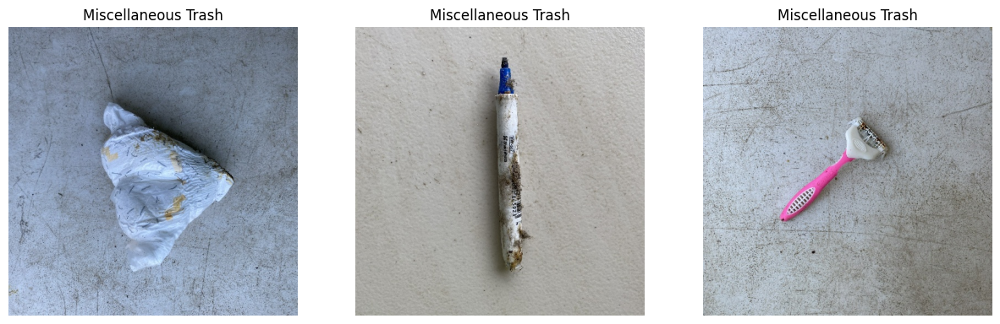

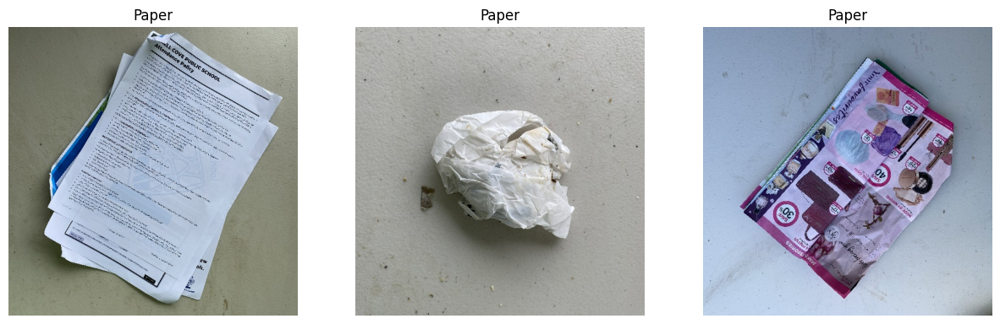

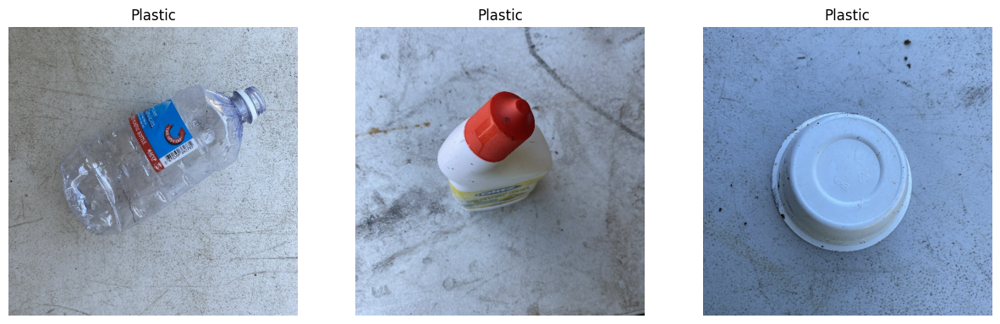

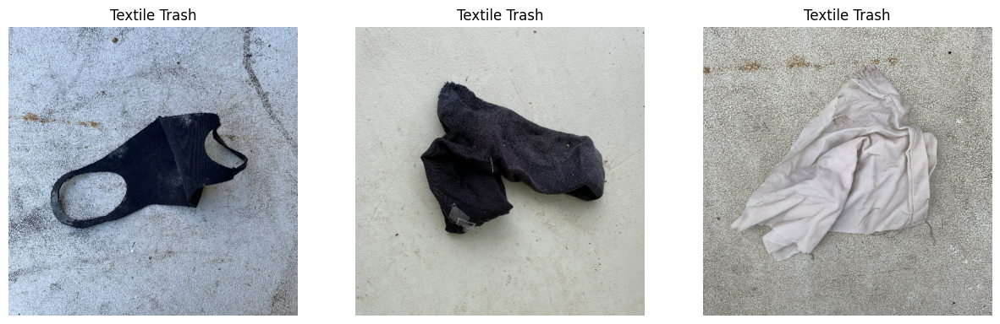

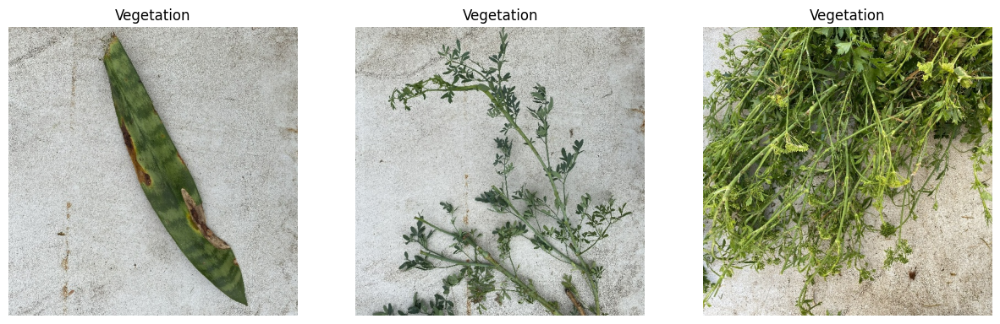

In [ ]:
import random
from PIL import Image

# Angenommen, `class_names` enthält die Namen aller Klassen
for class_name in class_names:
    # Pfad zum Klassenordner
    class_folder = os.path.join(data_path, class_name)

    # Liste aller Bilddateien in diesem Ordner
    image_files = os.listdir(class_folder)

    # Wähle zufällig drei Bilder
    selected_images = random.sample(image_files, 3)

    # Bilder anzeigen
    plt.figure(figsize=(15, 5))
    for i, image_file in enumerate(selected_images):
        img_path = os.path.join(class_folder, image_file)
        img = Image.open(img_path)
        plt.subplot(1, 3, i+1)
        plt.imshow(img)
        plt.title(class_name)
        plt.axis('off')
    plt.show()


## Feature Engineering

* Farbhistogramme
* Textur
* Form

### Farbhistogramme

Farbhistogramme geben an, wie oft eine jede Farbe in einem Bild vorkommt. Das kann ein nützliches Feature sein, wenn die Farbe ein unterscheidendes Merkmal zwischen den Klassen ist. Die Histogramme müssen normalisiert werden, um als Features verwendet werden zu können.

Die Funktion **extract_color_features** gibt zwei Numpy-Arrays zurück: **feature_array** enthält die Feature-Vektoren und labels_array enthält die entsprechenden Klassenbezeichnungen. Diese Arrays werden dann für das Training der Klassifikationsmodelle verwendet.

In [6]:
# Dieser Code extrahiert das Farbhistogramm in normalisierter Form als Feature für jedes Bild aus den vorverarbeiteten Daten (images_resized)

def extract_color_features(images, bins=256, channel_range=(0, 256)):
    # Initialize the feature list
    feature_list = []
    labels_list = []

    # Loop through each class in the dataset
    for class_name, imgs in images.items():
        # Process each image in the class
        for img in imgs:
            # Calculate histogram for each color channel
            hist_features_color = []
            for i in range(3):  # Assuming RGB images
                hist = np.histogram(img[:, :, i], bins=bins, range=channel_range)[0]
                hist = hist / hist.sum()  # Normalize the histogram
                hist_features_color.extend(hist)

            # Append the histogram to the feature list
            feature_list.append(hist_features_color)
            labels_list.append(class_name)

    # Convert feature list and labels list to numpy arrays
    feature_array_colorhist = np.array(feature_list)
    labels_array = np.array(labels_list)

    return feature_array_colorhist, labels_array

# Die nachfolgende Zeile extrahiert die features (--> Farbhistogramm) und labels aus den geladenen Bildern
feature_array_colorhist, labels_array = extract_color_features(images_resized)

In [ ]:
# Edges extrahieren

In [10]:
def extract_edge_features(images):
    # Initialize the feature list
    feature_list_edges = []
    labels_list_edges = []

    # Loop through each class in the dataset
    for class_name, imgs in images.items():
        # Process each image in the class
        for img in imgs:
            # Apply Sobel operator to each color channel
            edge_features = []
            for i in range(3):  # Assuming RGB images
                # Apply Sobel operator to the i-th channel
                sobel_edges = sobel(img[:, :, i])

                # Calculate the magnitude of the gradients
                magnitude = np.sqrt(sobel_edges.astype(np.float64) ** 2)
                magnitude = magnitude / magnitude.sum()  # Normalize the magnitude

                # Flatten the magnitude and extend the feature list
                edge_features.extend(magnitude.ravel())

            # Append the edge features to the list
            feature_list_edges.append(edge_features)
            labels_list_edges.append(class_name)

    # Convert feature list and labels list to numpy arrays
    feature_array_edges = np.array(feature_list_edges)
    labels_array_edges = np.array(labels_list_edges)

    return feature_array_edges, labels_array_edges

# Uncomment the following lines to extract edge features from the resized images
# feature_array_edges, labels_array_edges = extract_edge_features(images_resized)


In [14]:
# Features für Color-Histogramme und Edges kombinieren

# Function to combine color and edge features
def combine_features(feature_array_colorhist, edge_features):
    # Concatenate the color and edge features along the last axis
    combined_features = np.concatenate((feature_array_colorhist, edge_features), axis=1)
    return combined_features_colorhist_edge


# Edge-Features und Color-Hist.-Features kombinieren
combined_features = combine_features(feature_array_colorhist, edge_features)

NameError: name 'combined_features_colorhist_edge' is not defined

Das neu erstellte Dictionary **color_histograms** ist ähnlich strukturiert wie _images_resized_, aber es enthält die Farbhistogramme der Bilder. Jedes Farbhistogramm ist hierbei ein flaches Array, das die normalisierte Anzahl von Pixeln in jedem Bin über alle drei Farbkanäle hinweg darstellt.

In [ ]:
import numpy as np
import cv2

def extract_color_histogram(image, bins=(8, 8, 8)):
    # Berechne das Histogramm und normalisiere es
    histogram = cv2.calcHist([image], [0, 1, 2], None, bins, [0, 256, 0, 256, 0, 256])
    histogram = cv2.normalize(histogram, histogram).flatten()
    return histogram

def apply_color_histograms(images_resized, bins=(8, 8, 8)):
    color_histograms = {}

    for class_name, images in images_resized.items():
        class_histograms = []
        for image in images:
            hist = extract_color_histogram(image, bins)
            class_histograms.append(hist)
        color_histograms[class_name] = class_histograms

    return color_histograms

color_histograms = apply_color_histograms(images_resized)


In [ ]:
# Prüfen, ob das neue Dictionary 'color_histograms' Werte enthält

if color_histograms:
    print("Das Dictionary 'color_histograms' enthält Werte.")

    # Überprüfe die Anzahl der Klassen
    print(f"Anzahl der Klassen im Dictionary: {len(color_histograms)}")

    # Überprüfe die Anzahl der Histogramme pro Klasse
    for class_name, histograms in color_histograms.items():
        if histograms:
            print(f"Klasse '{class_name}' enthält {len(histograms)} Histogramme.")
        else:
            print(f"Klasse '{class_name}' enthält keine Histogramme.")
else:
    print("Das Dictionary 'color_histograms' ist leer.")


Das Dictionary 'color_histograms' enthält Werte.
Anzahl der Klassen im Dictionary: 9
Klasse 'Cardboard' enthält 461 Histogramme.
Klasse 'Food Organics' enthält 411 Histogramme.
Klasse 'Glass' enthält 420 Histogramme.
Klasse 'Metal' enthält 790 Histogramme.
Klasse 'Miscellaneous Trash' enthält 495 Histogramme.
Klasse 'Paper' enthält 500 Histogramme.
Klasse 'Plastic' enthält 921 Histogramme.
Klasse 'Textile Trash' enthält 318 Histogramme.
Klasse 'Vegetation' enthält 436 Histogramme.


**Statistische Analyse für die normalisierten Farbhistogramme durchführen**

--> Mittelwert und Standardabweichung für jede Klasse

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Statistische Analyse für jede Klasse durchführen
for class_name, histograms in color_histograms.items():
    # Mittelwert und Standardabweichung berechnen
    mean_histogram = np.mean(histograms, axis=0)
    std_histogram = np.std(histograms, axis=0)

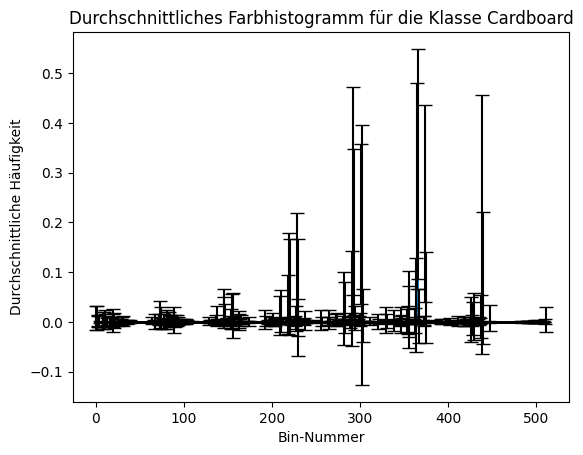

In [ ]:
import matplotlib.pyplot as plt

# Wähle eine Klasse zum Visualisieren aus, z.B. 'Cardboard'
class_name = 'Cardboard'
mean_histogram = np.mean(color_histograms[class_name], axis=0)
std_histogram = np.std(color_histograms[class_name], axis=0)

# Erstelle ein Balkendiagramm für das mittlere Farbhistogramm
plt.bar(range(len(mean_histogram)), mean_histogram, yerr=std_histogram, capsize=5)
plt.title(f'Durchschnittliches Farbhistogramm für die Klasse {class_name}')
plt.xlabel('Bin-Nummer')
plt.ylabel('Durchschnittliche Häufigkeit')
plt.show()


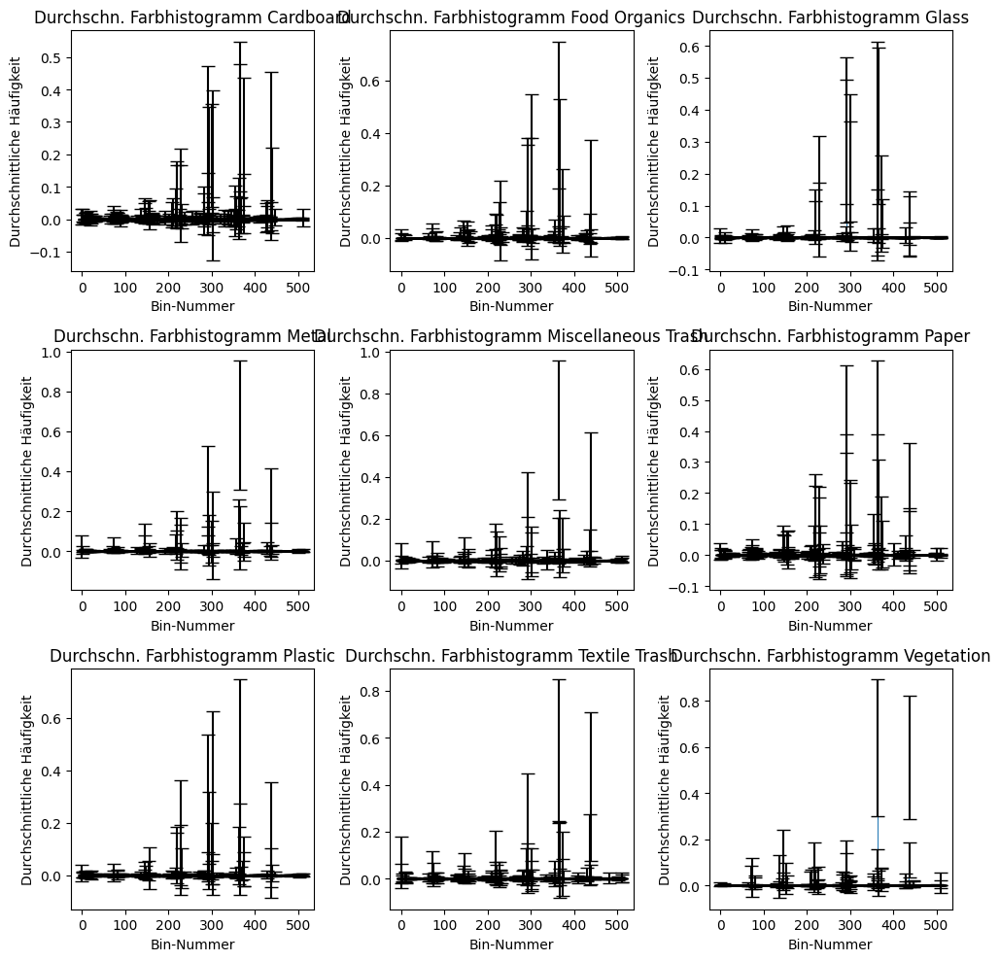

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Annahme: 'color_histograms' ist dein Dictionary mit Histogrammen für jede Klasse
def plot_color_histograms(color_histograms):
    fig, axes = plt.subplots(3, 3, figsize=(10, 10))  # Erstelle ein 3x3 Raster für Subplots
    class_names = list(color_histograms.keys())  # Liste der Klassennamen
    for ax, class_name in zip(axes.flatten(), class_names):
        mean_histogram = np.mean(color_histograms[class_name], axis=0)  # Mittelwert berechnen
        std_histogram = np.std(color_histograms[class_name], axis=0)  # Standardabweichung berechnen
        ax.bar(range(len(mean_histogram)), mean_histogram, yerr=std_histogram, capsize=5)
        ax.set_title(f'Durchschn. Farbhistogramm {class_name}')
        ax.set_xlabel('Bin-Nummer')
        ax.set_ylabel('Durchschnittliche Häufigkeit')
    plt.tight_layout()
    plt.show()

# Ersetze 'color_histograms' durch dein tatsächliches Dictionary mit Histogrammen
plot_color_histograms(color_histograms)


### Kanten erkennen: Sobel-Operator

### Canny Edge Detection

In [ ]:
import cv2
from matplotlib import pyplot as plt

def apply_canny_edge_detection(images_resized, lower_threshold=100, upper_threshold=200):
    """
    Wendet Canny Edge Detection auf jedes Bild im images_resized Dictionary an.
    Die Schwellenwerte können angepasst werden, um die Empfindlichkeit der Kantenentdeckung zu steuern.

    Args:
    images_resized (dict): Ein Dictionary mit Klassennamen als Schlüssel und Listen von Bildern als Werte.
    lower_threshold (int): Der untere Schwellenwert für den Canny-Algorithmus.
    upper_threshold (int): Der obere Schwellenwert für den Canny-Algorithmus.

    Returns:
    dict: Ein Dictionary mit denselben Schlüsseln wie images_resized, aber die Bilder sind jetzt Kantenbilder.
    """
    images_canny = {}
    for class_name, images in images_resized.items():
        images_canny[class_name] = []
        for image in images:
            # Konvertiere das Bild in Graustufen, da Canny nur auf Ein-Kanal-Bilder angewendet wird
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            # Wende Canny Edge Detection an
            edges = cv2.Canny(gray_image, lower_threshold, upper_threshold)
            images_canny[class_name].append(edges)

    return images_canny

# Beispiel für die Anwendung von Canny Edge Detection
images_canny = apply_canny_edge_detection(images_resized)

# Optional: Anzeigen eines Bildes vor und nach der Anwendung von Canny Edge Detection
# Wählen Sie eine Klasse und ein Bildindex zum Anzeigen aus
class_name = list(images_canny.keys())[0]  # Erste Klasse auswählen
image_index = 0  # Erstes Bild auswählen

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(images_resized[class_name][image_index], cmap='gray')
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(images_canny[class_name][image_index], cmap='gray')
plt.title('Canny Edge Image')
plt.show()


<IPython.core.display.Javascript object>

In [ ]:
# Überprüfen Sie die Anzahl der Klassen und Bilder pro Klasse
for class_name, images in images_canny.items():
    print(f"Klasse: {class_name}, Anzahl der Bilder: {len(images)}")

# Versuchen Sie, ein Bild zu plotten, wenn vorhanden
if images_canny:  # Überprüfen Sie, ob das Dictionary nicht leer ist
    class_name = list(images_canny.keys())[0]  # Erste Klasse auswählen
    if images_canny[class_name]:  # Überprüfen Sie, ob Bilder in der Klasse vorhanden sind
        image_index = 0  # Erstes Bild auswählen
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(images_resized[class_name][image_index], cmap='gray')
        plt.title('Original Image')
        plt.subplot(1, 2, 2)
        plt.imshow(images_canny[class_name][image_index], cmap='gray')
        plt.title('Canny Edge Image')
        plt.show()
    else:
        print(f"Keine Bilder in der Klasse {class_name} gefunden.")
else:
    print("Das Dictionary images_canny ist leer.")


Klasse: Cardboard, Anzahl der Bilder: 461
Klasse: Food Organics, Anzahl der Bilder: 411
Klasse: Glass, Anzahl der Bilder: 420
Klasse: Metal, Anzahl der Bilder: 790
Klasse: Miscellaneous Trash, Anzahl der Bilder: 495
Klasse: Paper, Anzahl der Bilder: 500
Klasse: Plastic, Anzahl der Bilder: 921
Klasse: Textile Trash, Anzahl der Bilder: 318
Klasse: Vegetation, Anzahl der Bilder: 436


<IPython.core.display.Javascript object>

### Textur

#### Local Binary Patterns

In [ ]:
from skimage.feature import local_binary_pattern
import numpy as np

def compute_lbp_histogram(image, P, R, method='uniform'):
    """
    Berechnet das LBP (Local Binary Pattern) für ein Bild und erstellt ein Histogramm der LBP-Werte.

    :param image: Einzelnes Bild als numpy array.
    :param P: Anzahl der kreisförmigen Nachbarn für LBP.
    :param R: Radius für kreisförmige Nachbarn in LBP.
    :param method: Methode zur Berechnung des LBP.
    :return: Histogramm der LBP-Werte.
    """
    # Berechne LBP für das Bild
    lbp_image = local_binary_pattern(image, P, R, method)

    # Erstelle ein Histogramm der LBP-Werte
    # Für 'uniform' LBP werden (P+2) Bins verwendet, da es P+1 uniforme Muster gibt plus 1 Bin für nicht-uniforme Muster
    n_bins = int(lbp_image.max() + 1)
    histogram, _ = np.histogram(lbp_image.ravel(), density=True, bins=n_bins, range=(0, n_bins))

    return lbp_features

# Beispiel für die Anwendung dieser Funktion:
# Angenommen, Sie haben ein Graustufenbild 'image'
# histogram = compute_lbp_histogram(image, P=8, R=1)


## Weiterführende Untersuchungen zu Farbverteilung und Pixelintensität



### Pixel-Intensitätsverteilung

**Ziele** der Untersuchung der Pixelintensitätsverteilung:
* Wie unterscheiden sich die Klassen in Helligkeit und Kontrast?
* Vorverarbeitung: Hilft bei der Entscheidung, ob ich eine Normierung oder Standardisierung der Pixelwerte vor dem Modelltraining durchführen sollte
* Anomalien erkennen


Pixelintensitätsverteilung auf die **SW-Bilder** über alle Klassen anwenden.:

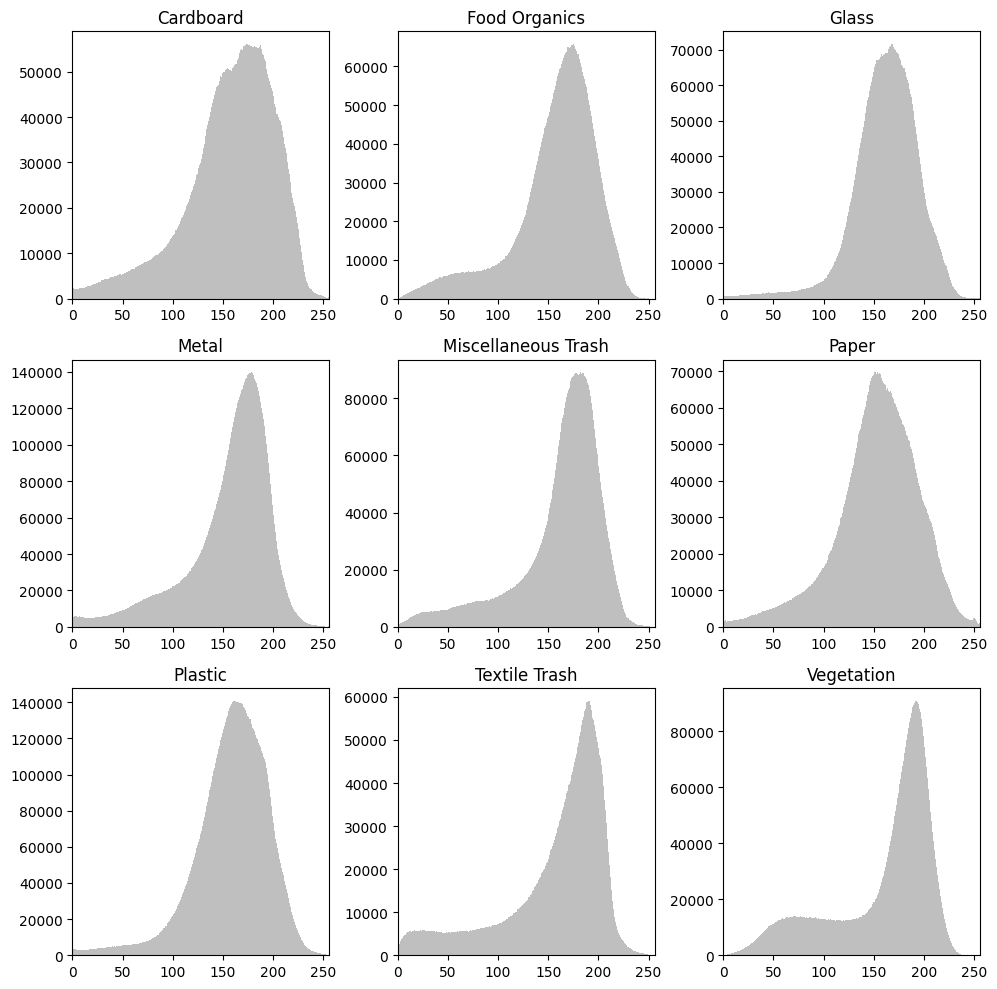

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(3, 3, figsize=(10, 10))  # 3x3 Matrix von Subplots

axes = axes.ravel()  # Flacht die Achsen-Matrix in eine Liste ab

for i, class_name in enumerate(class_names):
    all_pixels = []
    # Sammle Pixel-Intensitäten für alle vorverarbeiteten Bilder der Klasse
    for img_array in images_resized[class_name]:
        all_pixels.extend(img_array.ravel())

    # Erstelle ein aggregiertes Histogramm für die gesamte Klasse
    axes[i].hist(all_pixels, bins=256, range=[0,256], color='gray', alpha=0.5)
    axes[i].set_title(class_name)
    axes[i].set_xlim([0, 256])

plt.tight_layout()
plt.show()


Pixelintensitätsverteilung auf die **Farb-Bilder** über alle Klassen anwenden:

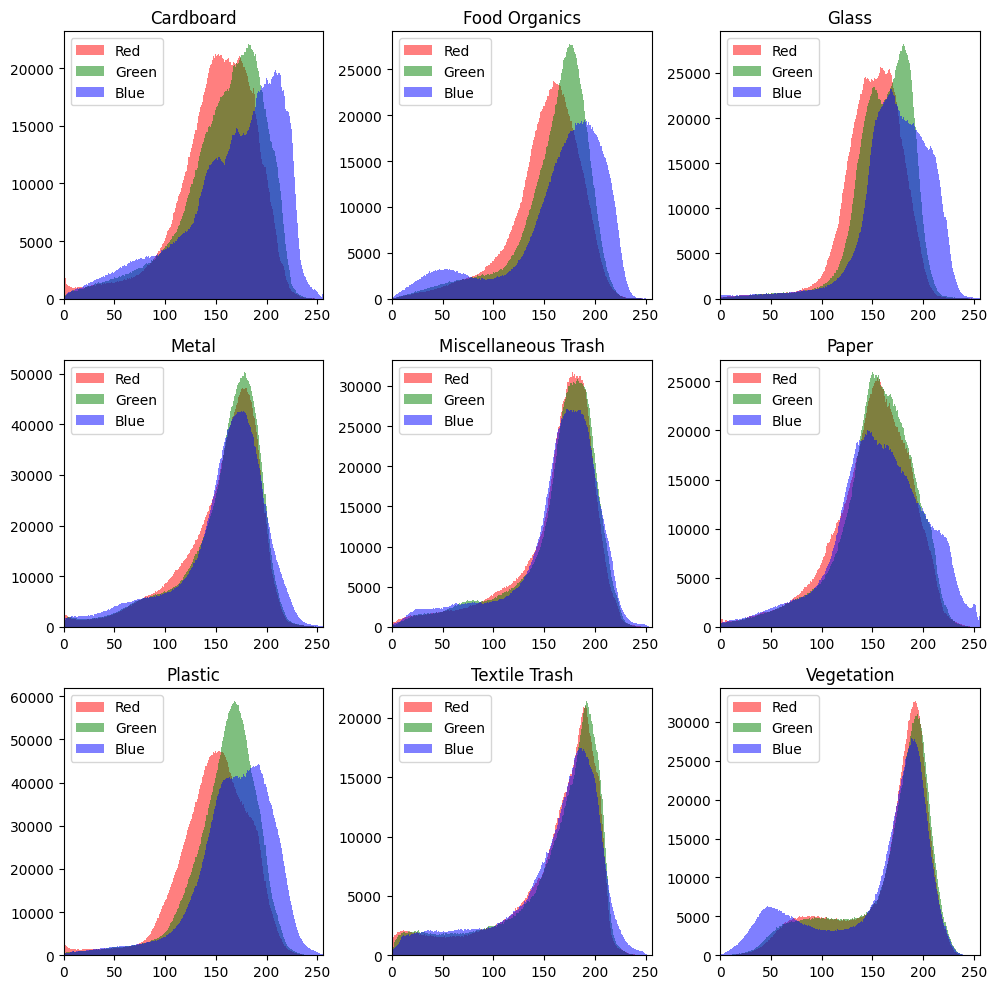

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Angenommen, `class_names` ist definiert und `images_resized` enthält die Bilder in Farbe
fig, axes = plt.subplots(3, 3, figsize=(10, 10))  # 3x3 Matrix von Subplots

axes = axes.ravel()  # Flacht die Achsen-Matrix in eine Liste ab

for i, class_name in enumerate(class_names):
    # Initialisiere Listen für die Pixelintensitäten der Kanäle
    pixels_r = []
    pixels_g = []
    pixels_b = []

    # Sammle Pixel-Intensitäten für alle vorverarbeiteten Bilder der Klasse
    for img in images_resized[class_name]:
        pixels_r.extend(img[:, :, 0].ravel())
        pixels_g.extend(img[:, :, 1].ravel())
        pixels_b.extend(img[:, :, 2].ravel())

    # Erstelle ein Histogramm für die RGB-Kanäle
    axes[i].hist(pixels_r, bins=256, range=[0,256], color='red', alpha=0.5, label='Red')
    axes[i].hist(pixels_g, bins=256, range=[0,256], color='green', alpha=0.5, label='Green')
    axes[i].hist(pixels_b, bins=256, range=[0,256], color='blue', alpha=0.5, label='Blue')

    axes[i].set_title(class_name)
    axes[i].set_xlim([0, 256])
    axes[i].legend()

plt.tight_layout()
plt.show()


Gib mir für jede Klasse der **Farbbilder** den **Median, den Durchschnitt und die Standardabweichung für RBG** aus.

In [ ]:
import numpy as np

# Angenommen, `class_names` ist definiert und `images_resized` enthält die RGB-Bilder
statistics = {}

for class_name in class_names:
    # Initialisiere Listen für die Pixelintensitäten der Kanäle
    pixels_r = []
    pixels_g = []
    pixels_b = []

    # Sammle Pixel-Intensitäten für alle vorverarbeiteten Bilder der Klasse
    for img in images_resized[class_name]:
        pixels_r.extend(img[:, :, 0].ravel())
        pixels_g.extend(img[:, :, 1].ravel())
        pixels_b.extend(img[:, :, 2].ravel())

    # Berechne Statistiken für jeden Kanal
    statistics[class_name] = {
        'median': {
            'red': np.median(pixels_r),
            'green': np.median(pixels_g),
            'blue': np.median(pixels_b)
        },
        'mean': {
            'red': np.mean(pixels_r),
            'green': np.mean(pixels_g),
            'blue': np.mean(pixels_b)
        },
        'std_dev': {
            'red': np.std(pixels_r),
            'green': np.std(pixels_g),
            'blue': np.std(pixels_b)
        }
    }

# Ausgabe der berechneten Statistiken
for class_name, stats in statistics.items():
    print(f"Klasse: {class_name}")
    for stat_name, channels in stats.items():
        print(f"  {stat_name.capitalize()}:")
        for channel, value in channels.items():
            print(f"    {channel.capitalize()}: {value:.2f}")
    print()


Klasse: Cardboard
  Median:
    Red: 155.00
    Green: 164.00
    Blue: 175.00
  Mean:
    Red: 149.12
    Green: 156.25
    Blue: 164.48
  Std_dev:
    Red: 40.12
    Green: 42.13
    Blue: 50.33

Klasse: Food Organics
  Median:
    Red: 156.00
    Green: 167.00
    Blue: 175.00
  Mean:
    Red: 150.18
    Green: 157.53
    Blue: 161.60
  Std_dev:
    Red: 35.55
    Green: 37.70
    Blue: 50.26

Klasse: Glass
  Median:
    Red: 153.00
    Green: 164.00
    Blue: 175.00
  Mean:
    Red: 150.18
    Green: 160.50
    Blue: 172.57
  Std_dev:
    Red: 28.91
    Green: 29.11
    Blue: 34.68

Klasse: Metal
  Median:
    Red: 163.00
    Green: 167.00
    Blue: 165.00
  Mean:
    Red: 153.02
    Green: 155.71
    Blue: 155.28
  Std_dev:
    Red: 40.57
    Green: 40.81
    Blue: 44.49

Klasse: Miscellaneous Trash
  Median:
    Red: 171.00
    Green: 173.00
    Blue: 171.00
  Mean:
    Red: 159.98
    Green: 161.92
    Blue: 160.47
  Std_dev:
    Red: 42.16
    Green: 42.76
    Blue: 45.39

Klas

## Dimensionaliätsreduktion / PCA

### PCA mit 2 Dimensionen

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Erstelle eine Matrix mit allen Bildern, flachgedrückt zu Vektoren
# wir beziehen uns dabei auf 'images_resized'
image_matrix = np.array([img.flatten() for class_images in images_resized.values() for img in class_images])

# Skaliere die Daten, um einen Mittelwert von 0 und eine Standardabweichung von 1 zu haben
scaler = StandardScaler()
image_matrix_scaled = scaler.fit_transform(image_matrix)

# Wende PCA an
pca = PCA(n_components=2)  # Reduziere beispielsweise auf 2 Dimensionen
principal_components_2d = pca.fit_transform(image_matrix_scaled)

# `principal_components_2d` enthält jetzt die transformierten Daten


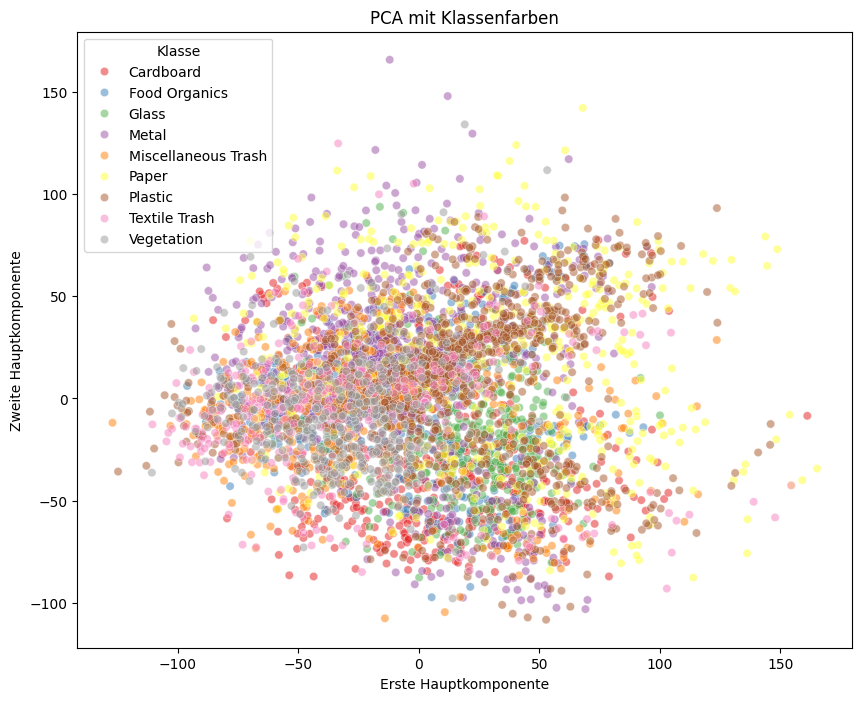

In [ ]:
import seaborn as sns
import pandas as pd

# Erstelle einen DataFrame für die Principal Components
df = pd.DataFrame(principal_components_2d, columns=['PC1', 'PC2'])

# Füge die Klassennamen hinzu. Angenommen, du hast eine Liste von Klassennamen,
# die der Reihenfolge der Bilder in `image_matrix` entsprechen.
class_labels = []
for class_name, images in images_resized.items():
    class_labels.extend([class_name] * len(images))
df['Klasse'] = class_labels

# Erstelle das Scatterplot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x='PC1', y='PC2', hue='Klasse', palette='Set1', alpha=0.5)
plt.title('PCA mit Klassenfarben')
plt.xlabel('Erste Hauptkomponente')
plt.ylabel('Zweite Hauptkomponente')
plt.legend(title='Klasse')
plt.show()



### PCA mit 3 Dimensionen

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Erstelle eine Matrix mit allen Bildern, flachgedrückt zu Vektoren
# wir beziehen uns dabei auf 'images_resized'
image_matrix = np.array([img.flatten() for class_images in images_resized.values() for img in class_images])

# Skaliere die Daten, um einen Mittelwert von 0 und eine Standardabweichung von 1 zu haben
scaler = StandardScaler()
image_matrix_scaled = scaler.fit_transform(image_matrix)

# Wende PCA an
pca = PCA(n_components=3)  # Reduziere beispielsweise auf 3 Dimensionen
principal_components_3d = pca.fit_transform(image_matrix_scaled)

# `principal_components` enthält jetzt die transformierten Daten

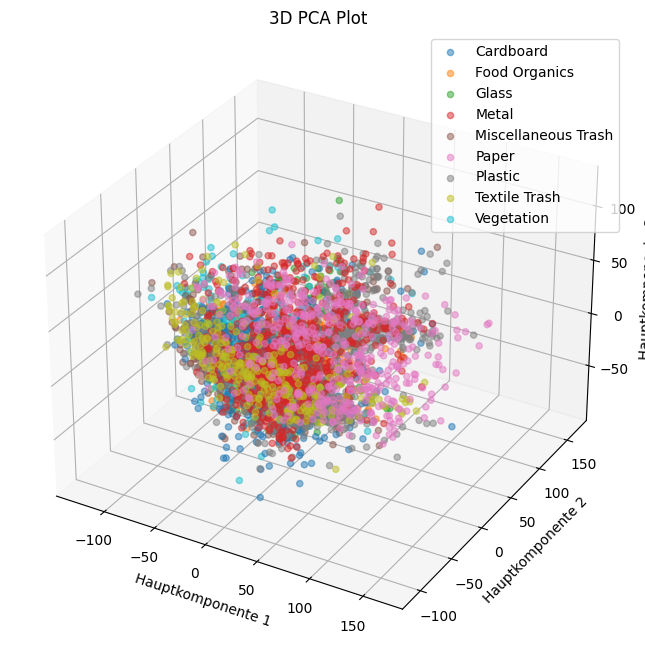

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

# Angenommen, `principal_components` ist das Ergebnis deiner PCA mit 3 Komponenten
# Und `class_labels` enthält die Klassenlabels in der gleichen Reihenfolge wie die `principal_components`

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Erzeuge eine Farbkarte basierend auf den Klassenlabels
colors = plt.cm.tab10(np.linspace(0, 1, len(class_names)))

# Scatterplot für jede Klasse
for class_name, color in zip(class_names, colors):
    # Wähle die Datenpunkte aus, die zur aktuellen Klasse gehören
    indices = [i for i, label in enumerate(class_labels) if label == class_name]
    ax.scatter(
        principal_components_3d[indices, 0],  # x-Werte
        principal_components_3d[indices, 1],  # y-Werte
        principal_components_3d[indices, 2],  # z-Werte
        label=class_name,
        color=color,
        alpha=0.5
    )

ax.set_xlabel('Hauptkomponente 1')
ax.set_ylabel('Hauptkomponente 2')
ax.set_zlabel('Hauptkomponente 3')
plt.title('3D PCA Plot')
plt.legend()
plt.show()


In [ ]:
import plotly.express as px
import pandas as pd

# Angenommen, principal_components und class_labels sind definiert
# df = pd.DataFrame(principal_components, columns=['PC1', 'PC2', 'PC3'])
# df['class'] = class_labels  # Stelle sicher, dass class_labels die richtigen Klassenlabels sind

# Erstelle ein 3D-Scatterplot-Diagramm
fig = px.scatter_3d(df, x='PC1', y='PC2', z='PC3',
                    color='class',  # Definiert die Farbkodierung
                    title="3D PCA Plot")

# Update die Layout-Einstellungen, um die Figurengröße zu ändern
fig.update_layout(width=1000, height=800)  # Du kannst diese Werte auf deine gewünschte Größe setzen

fig.show()


In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# Angenommen, principal_components und class_labels sind definiert
# df = pd.DataFrame(principal_components, columns=['PC1', 'PC2', 'PC3'])
# df['class'] = class_labels  # Stelle sicher, dass class_labels die richtigen Klassenlabels sind

# Eindeutige Klassenlabels
unique_labels = df['class'].unique()

# Erstelle ein Subplot-Grid
fig = make_subplots(
    rows=3, cols=3,
    specs=[[{'type': 'scatter3d'} for _ in range(3)] for _ in range(3)],
    subplot_titles=[f'Klasse {label}' for label in unique_labels]
)

# Set1 Farbpalette
set1_palette = px.colors.qualitative.Set1

# Füge für jede Klasse einen 3D-Scatterplot hinzu
for i, label in enumerate(unique_labels):
    class_df = df[df['class'] == label]
    trace = go.Scatter3d(
        x=class_df['PC1'], y=class_df['PC2'], z=class_df['PC3'],
        mode='markers',
        marker=dict(
            size=3,
            color=set1_palette[i % len(set1_palette)],  # Farbe für die Klasse
        ),
        name=f'Klasse {label}'
    )
    fig.add_trace(trace, row=i//3+1, col=i%3+1)

# Update die Layout-Einstellungen für jede einzelne Plotgröße
fig.update_layout(height=900, width=900, title_text="3D PCA Plots für jede Klasse")

# Update die Layout-Einstellungen für jedes Subplot
for i in range(1, 10):
    fig.update_scenes(
        dict(
            camera=dict(
                eye=dict(x=1.25, y=1.25, z=1.25)
            )
        ),
        row=(i-1)//3+1,
        col=(i-1)%3+1
    )

fig.show()
